# Using Deep and Gradient Explainers to interpret a PyTorch CNN classifier on the MNIST dataset

### 1. Design the CNN from scatch

In [1]:
import torch, torchvision
from torchvision import datasets, transforms
from torch import nn, optim
from torch.nn import functional as F
torch.manual_seed(0)

import numpy as np

batch_size = 128
num_epochs = 1
device = torch.device('cpu')

class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()

        self.conv_layers = nn.Sequential(
            nn.Conv2d(1, 10, kernel_size=5),
            nn.MaxPool2d(2),
            nn.ReLU(),
            nn.Conv2d(10, 20, kernel_size=5),
            nn.Dropout(),
            nn.MaxPool2d(2),
            nn.ReLU(),
        )
        self.fc_layers = nn.Sequential(
            nn.Linear(320, 50),
            nn.ReLU(),
            nn.Dropout(),
            nn.Linear(50, 10),
            nn.Softmax(dim=1)
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = x.view(-1, 320)
        x = self.fc_layers(x)
        return x

def train(model, device, train_loader, optimizer, epoch):
    model.train()
    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(data)
        loss = F.nll_loss(output.log(), target)
        loss.backward()
        optimizer.step()
        if batch_idx % 100 == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(train_loader.dataset),
                100. * batch_idx / len(train_loader), loss.item()))


train_loader = torch.utils.data.DataLoader(
    datasets.MNIST('mnist_data', train=True, download=True,
                   transform=transforms.Compose([
                       transforms.ToTensor()
                   ])),
    batch_size=batch_size, shuffle=True)

test_loader = torch.utils.data.DataLoader(
    datasets.MNIST('mnist_data', train=False, transform=transforms.Compose([
                       transforms.ToTensor()
                   ])),
    batch_size=batch_size, shuffle=True)

model = Net().to(device)
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.5)

/localdisk/daniel/conda_envs/xai/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### 2. Train the CNN on the MNIST dataset

In [2]:
for epoch in range(1, num_epochs + 1):
    train(model, device, train_loader, optimizer, epoch)

Train Epoch: 1 [0/60000 (0%)]	Loss: 2.312237
Train Epoch: 1 [12800/60000 (21%)]	Loss: 2.256531
Train Epoch: 1 [25600/60000 (43%)]	Loss: 1.771387
Train Epoch: 1 [38400/60000 (64%)]	Loss: 0.962741
Train Epoch: 1 [51200/60000 (85%)]	Loss: 0.773684


### 3. Predict the MNIST test data

In [3]:
# test the model
model.eval()
test_loss = 0
correct = 0
y_true = torch.empty(0)
y_pred = torch.empty((0, 10))
X_test = torch.empty((0, 1, 28, 28))

with torch.no_grad():
    for data, target in test_loader:
        data, target = data.to(device), target.to(device)
        output = model(data)
        X_test = torch.cat((X_test, data))
        y_true, y_pred = torch.cat((y_true, target)), torch.cat((y_pred, output))

        test_loss += F.nll_loss(output.log(), target).item() # sum up batch loss
        pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability
        correct += pred.eq(target.view_as(pred)).sum().item()

test_loss /= len(test_loader.dataset)
print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
    test_loss, correct, len(test_loader.dataset),
100. * correct / len(test_loader.dataset)))


Test set: Average loss: 0.0051, Accuracy: 8854/10000 (89%)



### 4. Survey performance across all classes using the metrics_explainer plugin

              precision    recall  f1-score   support

           0       0.94      0.97      0.95       980
           1       0.94      0.97      0.96      1135
           2       0.87      0.92      0.89      1032
           3       0.88      0.89      0.89      1010
           4       0.88      0.84      0.86       982
           5       0.87      0.83      0.85       892
           6       0.86      0.94      0.90       958
           7       0.95      0.82      0.88      1028
           8       0.89      0.82      0.85       974
           9       0.78      0.85      0.81      1009

    accuracy                           0.89     10000
   macro avg       0.89      0.88      0.88     10000
weighted avg       0.89      0.89      0.89     10000



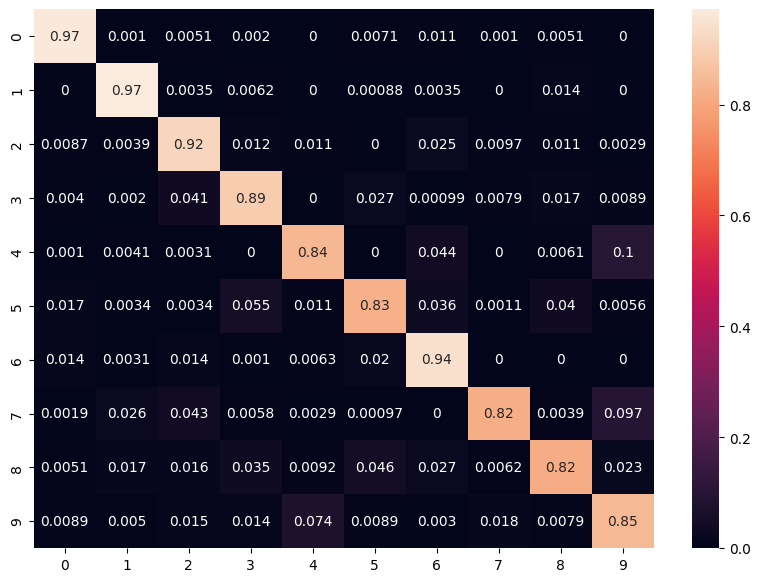

In [4]:
from explainer.explainers import metrics_explainer

classes = np.array(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'])

# one-hot-encode for metrics explanation
oh_y_true = torch.from_numpy(np.eye(int(torch.max(y_true)+1))[list(y_true.numpy().astype(int))])

cm = metrics_explainer['confusionmatrix'](oh_y_true, y_pred, classes)
cm.visualize()
print(cm.report)

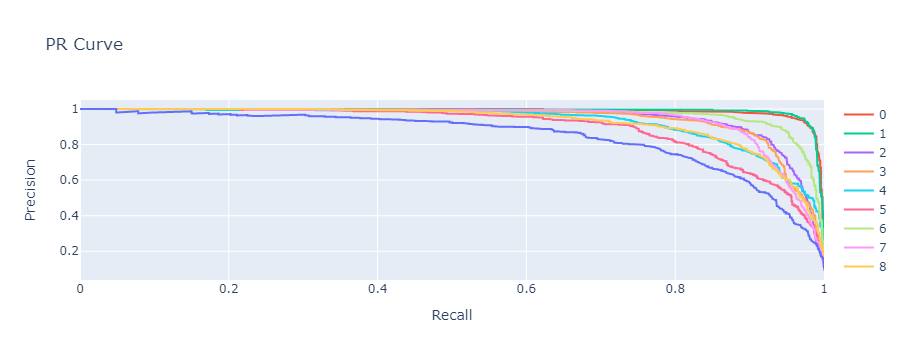

In [5]:
plotter = metrics_explainer['plot'](oh_y_true, y_pred, classes)
plotter.pr_curve()

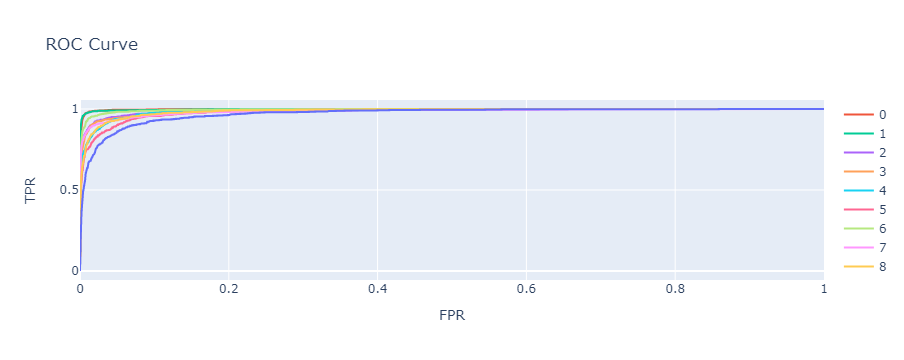

In [6]:
plotter.roc_curve()

### 5. Explain performance across the classes using the feature_attributions_explainer plugin

##### From (4), it can be observed from the confusion matrix that classes 4 and 9 perform poorly. Additionallly, there is a high misclassification rate exclusively amongst the two labels. In other words, it appears that the CNN if confusing 4's with 9's, and vice-versa. 7.4% of all the 9 examples were misclassified as 4, and 10% of all the 4 examples were misclassified as 9.

##### Let's take a closer look at the pixel-based shap values for the test examples where the CNN predicts '9' when the correct groundtruth label is '4'.

In [7]:
# get the prediction indices where the model predicted 9
pred_idx = list(np.where(np.argmax(y_pred, axis=1) == 9)[0])
# get the groundtruth indices where the true label is 4
gt_idx = list(np.where(y_true == 4)[0])

# collect the indices where the CNN misclassified 4 as 9
matches = list(set(pred_idx).intersection(gt_idx))

In [8]:
from explainer.explainers import feature_attributions_explainer
# instatiate deep explainer object
deepexplainer = feature_attributions_explainer['deepexplainer']

Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.


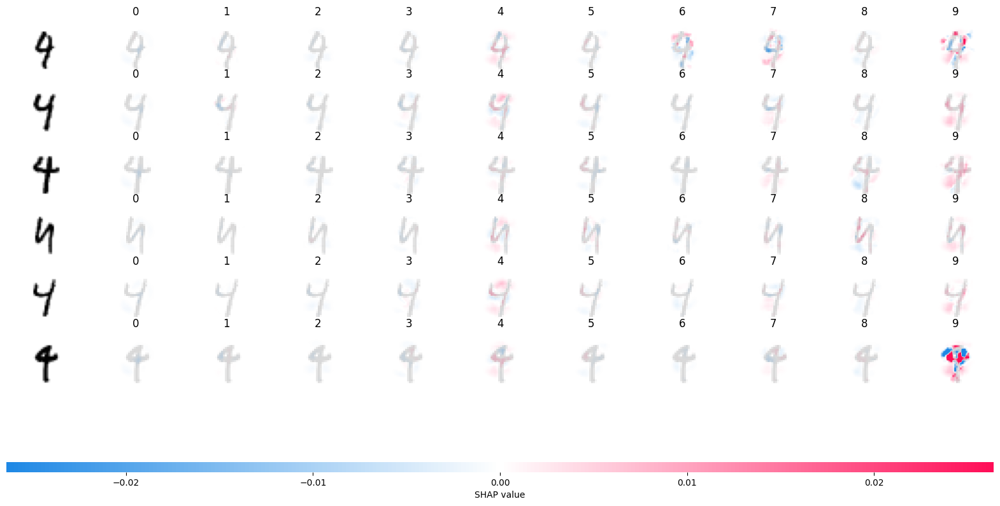

In [9]:
# run the deep explainer
deViz = deepexplainer(model, X_test[:100], X_test[matches[:6]], classes)
deViz.visualize()

In [10]:
# instatiate gradient explainer object
gradientexplainer = feature_attributions_explainer['gradientexplainer']

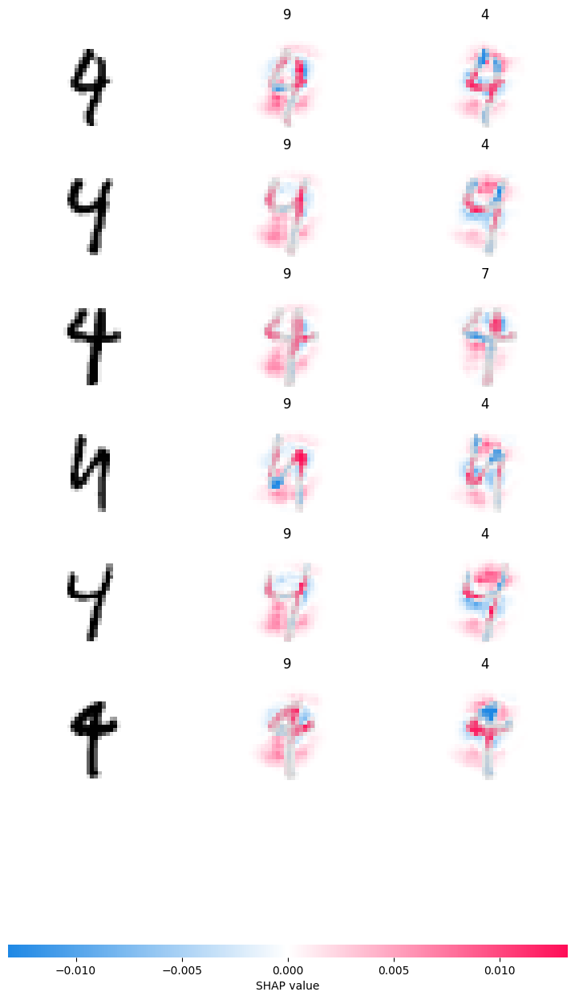

In [11]:
# run the deep explainer
grViz = gradientexplainer(model, X_test[:100],  X_test[matches[:6]], 2, classes)
grViz.visualize()

### 6. Conclusion

##### From the deep and gradient explainer visuals, it can be observed that the CNN pays close attention to the top of the digit in distinguishing between a 4 and a 9. On the first and last row of the above gradient explainer visualization we can the 4's are closed. The contributes to postiive shap values (red) for the 9 classification. This begins explaining why the CNN is confusing the two digits.